# **Data processing**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta

In [3]:
transaction = pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case_ Portfolio 2//2022 Case challenge_ DA update.xlsx', sheet_name='Data. Transactions')
transaction.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,Rank,%cash back
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,NaN,NaN,NaN
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,NaN,NaN,NaN
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,NaN,NaN,NaN
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,NaN,NaN,NaN
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,NaN,NaN,NaN


In [4]:
transaction=transaction.iloc[:,:-3]
transaction.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs


In [5]:
loyalty_points= pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case_ Portfolio 2//2022 Case challenge_ DA update.xlsx', sheet_name='Data. Loyalty Points')
loyalty_points.head(5)

,Service Group,Point Mechanism,Maximum Point Per Trans
0,supermarket,1 points/1000VND GMV,500 points
1,data,10 points/1000VND GMV,1000 points
2,cvs,1 points/1000VND GMV,300 points
3,marketplace,1 points/1000VND GMV,500 points
4,Coffee chains and Milk tea,1 points/1000VND GMV,500 points


In [6]:
merchant=pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case_ Portfolio 2//2022 Case challenge_ DA update.xlsx', sheet_name='Data.Merchant')
merchant.head(5)

,ServiceID,Service Group,Merchant,MerchantID
0,7eleven,cvs,7eleven,1
1,MOMOIOQC20191008,cvs,7eleven,1
2,opcaeon,supermarket,Aeon Mall,2
3,MOMOGPCQ20190613,supermarket,Aeon Mall,2
4,MOMOONXG20191120,supermarket,Aeon Mall,2


In [7]:
benefit=pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case_ Portfolio 2//2022 Case challenge_ DA update.xlsx', sheet_name='Data. Loyalty benefits')
benefit.head(5)

,Class ID,Group,%cashback
0,2,cvs,5
1,2,Offline Beverage,5
2,2,data,5
3,3,cvs,7
4,3,Offline Beverage,7


In [8]:
rank=pd.read_excel('C://Users//Le Ngoc//Desktop//Project//Case_ Portfolio 2//2022 Case challenge_ DA update.xlsx', sheet_name='Rank')
rank

,Class ID,Rank_name
0,1,STANDARD
1,2,SILVER
2,3,GOLD
3,4,DIAMOND


In [9]:
merchant_info = pd.merge(merchant,loyalty_points,on='Service Group',how='left')
merchant_info.head(5)

,ServiceID,Service Group,Merchant,MerchantID,Point Mechanism,Maximum Point Per Trans
0,7eleven,cvs,7eleven,1,1 points/1000VND GMV,300 points
1,MOMOIOQC20191008,cvs,7eleven,1,1 points/1000VND GMV,300 points
2,opcaeon,supermarket,Aeon Mall,2,1 points/1000VND GMV,500 points
3,MOMOGPCQ20190613,supermarket,Aeon Mall,2,1 points/1000VND GMV,500 points
4,MOMOONXG20191120,supermarket,Aeon Mall,2,1 points/1000VND GMV,500 points


In [10]:
loyalty_points['Service Group']
loyalty_points[['MaxPoint','pt']] =loyalty_points['Maximum Point Per Trans'].str.split(' ',expand =True,n=1)
loyalty_points

,Service Group,Point Mechanism,Maximum Point Per Trans,MaxPoint,pt
0,supermarket,1 points/1000VND GMV,500 points,500,points
1,data,10 points/1000VND GMV,1000 points,1000,points
2,cvs,1 points/1000VND GMV,300 points,300,points
3,marketplace,1 points/1000VND GMV,500 points,500,points
4,Coffee chains and Milk tea,1 points/1000VND GMV,500 points,500,points
5,Offline Beverage,1 points/1000VND GMV,300 points,300,points


**Combined with the 'Loyalty Points' table, add a column 'Loyalty Points' in 'Transactions' table with given rules. Then create another table named 'Loyalty Ranking' which must includes columns named Rank_name and Calculated_points to calculate the Rank of each user on daily basic.**

In [11]:
loyalty_points['MaxPoint']= loyalty_points['MaxPoint'].astype(int)
loyalty_points.dtypes

Service Group              object
Point Mechanism            object
Maximum Point Per Trans    object
MaxPoint                    int32
pt                         object
dtype: object

In [12]:
condition_data = transaction['Service Group'] == 'data'


transaction.loc[condition_data, 'Loyalty points'] = transaction.loc[condition_data, 'GMV'] / 100
transaction.loc[~condition_data, 'Loyalty points'] = transaction.loc[~condition_data, 'GMV'] / 1000

transaction.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0


In [13]:
for a,b in  zip(loyalty_points['Service Group'],loyalty_points['MaxPoint']):
      condition = transaction['Service Group'] == a
      transaction.loc[condition,'Loyalty points'] =transaction.loc[condition,'Loyalty points'].apply(lambda x:x if x <= b else b)

**At the end of Mar 2022, how many user achived rank Gold?**
**Note: Points calculated for each transaction will be expired after 30 days since the day that transaction is made**

In [14]:
endofMar=transaction[(transaction['DATE']>'2022-03-01')&(transaction['DATE']<'2022-04-01')]
endofMar.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points
42637,2022-03-02,21549087636,Supermarket,25,45715492,55000,supermarket,55.0
42638,2022-03-02,21558157954,Supermarket,25,44080459,203600,supermarket,203.6
42639,2022-03-02,21545970988,Supermarket,25,37381541,526400,supermarket,500.0
42640,2022-03-02,21557916934,Supermarket,25,44080459,25000,supermarket,25.0
42641,2022-03-02,21562502367,CVS,28,47025182,36000,cvs,36.0


In [15]:
endofMar =endofMar[['User_id','GMV','Loyalty points']]
endofMar = endofMar.groupby('User_id').sum()
endofMar.head(5)

,GMV,Loyalty points
User_id,,
162483,79000,79.0
298202,48000,48.0
321062,627000,627.0
414676,62000,620.0
422520,84000,840.0


In [16]:
endofMar['Rank']=endofMar['Loyalty points'].apply(lambda x: 'STANDARD' if x<=999 else('SILVER'if x<=1999 else('GOLD'if x<=4999 else ('DIAMOND'))))
endofMar.head(5)

,GMV,Loyalty points,Rank
User_id,,,
162483,79000,79.0,STANDARD
298202,48000,48.0,STANDARD
321062,627000,627.0,STANDARD
414676,62000,620.0,STANDARD
422520,84000,840.0,STANDARD


In [17]:
count = endofMar['Rank']
count.value_counts()

Rank
STANDARD    1490
SILVER       294
GOLD         123
DIAMOND       14
Name: count, dtype: int64

**Total cashback cost in February 2022**

In [18]:
benefit_info = pd.merge(benefit,rank,on='Class ID',how='left')
benefit_info=benefit_info.rename(columns={'Rank_name':'Rank','Group':'Service Group'})
benefit_info.head(5)

,Class ID,Service Group,%cashback,Rank
0,2,cvs,5,SILVER
1,2,Offline Beverage,5,SILVER
2,2,data,5,SILVER
3,3,cvs,7,GOLD
4,3,Offline Beverage,7,GOLD


In [19]:
def calculate_loyalty_point(user, date):
  user_transactions = transaction[transaction['User_id'] == user]
  upper_filter = user_transactions['DATE'] <= date
  lower_filter = user_transactions['DATE'] >= (date - timedelta(days=30))
  within_30d_transactions = user_transactions[upper_filter & lower_filter]
  accumulated_loyalty_points = within_30d_transactions['Loyalty points'].sum() 
  return accumulated_loyalty_points  

In [20]:
transaction['30 days accumulated loyalty points'] = transaction.apply(lambda row: calculate_loyalty_point(row['User_id'],row['DATE']), axis=1)

In [21]:
transaction['Rank']=transaction['30 days accumulated loyalty points'].apply(lambda x:'STANDARD' if x<=999 else('SILVER'if x<=1999 else('GOLD'if x<=4999 else ('DIAMOND'))))
transaction.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD


In [22]:
rank=rank.rename(columns={'Rank_name':'Rank'})
rank

,Class ID,Rank
0,1,STANDARD
1,2,SILVER
2,3,GOLD
3,4,DIAMOND


In [23]:
transactions=pd.merge(transaction,rank,on='Rank',how='left')
transactions.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1


In [24]:
transactions=pd.merge(transactions,benefit_info,on=['Rank','Service Group'],how='left')
transactions.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID_x,Class ID_y,%cashback
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,NaN,NaN
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,NaN,NaN
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,NaN,NaN
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,NaN,NaN
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,NaN,NaN


In [25]:
transactions=transactions.drop(columns='Class ID_y')
transactions=transactions.rename(columns={'Class ID_x':'Class ID'})
transactions.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,NaN
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,NaN
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,NaN
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,NaN
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,NaN


In [26]:
transactions['%cashback'].fillna(0,inplace=True)

In [27]:
transactions['cashback']=transactions['GMV']*(transactions['%cashback']/100)
transactions.dtypes

DATE                                  datetime64[ns]
Order_id                                       int64
NEWVERTICAL_Merchant                          object
MerchantID                                     int64
User_id                                        int64
GMV                                            int64
Service Group                                 object
Loyalty points                               float64
30 days accumulated loyalty points           float64
Rank                                          object
Class ID                                       int64
%cashback                                    float64
cashback                                     float64
dtype: object

In [28]:
transactions['cashback']=transactions['cashback'].apply(lambda x:x if x <10000 else 10000)
transactions.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback
0,2021-01-01,8733622706,Marketplace,37,61386143,100000,marketplace,100.0,100.0,STANDARD,1,0.0,0.0
1,2021-01-01,8726857991,Supermarket,9,48453125,5000,supermarket,5.0,5.0,STANDARD,1,0.0,0.0
2,2021-01-01,8737326894,Supermarket,9,49921027,106600,supermarket,106.6,106.6,STANDARD,1,0.0,0.0
3,2021-01-01,8732579078,supermarket,9,46022523,270000,supermarket,270.0,270.0,STANDARD,1,0.0,0.0
4,2021-01-01,8725567343,CVS,8,44014594,68000,cvs,68.0,80.0,STANDARD,1,0.0,0.0


In [29]:
feb =transactions[(transactions['DATE']>='2022-02-01')&(transaction['DATE']<'2022-03-01')]
feb.head(5)

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback
36987,2022-02-01,20510379115,Airtime,30,32983630,14000,data,140.0,590.0,STANDARD,1,0.0,0.0
36988,2022-02-01,20514342785,Airtime,30,3560552,10000,data,100.0,1564.0,SILVER,2,5.0,500.0
36989,2022-02-01,20502357355,Airtime,30,52261329,28000,data,280.0,480.0,STANDARD,1,0.0,0.0
36990,2022-02-01,20514894447,Airtime,30,45221505,20000,data,200.0,250.0,STANDARD,1,0.0,0.0
36991,2022-02-01,20498110250,Airtime,30,32983630,5000,data,50.0,590.0,STANDARD,1,0.0,0.0


In [30]:
feb['cashback'].sum()

4668841.74

The total cost of cashback in February is 4668841.74

**Design a weekly retention charts of since the program was lauched to monitor**

In [31]:
def weekly_retention (user,date):
    user_transaction = transactions[transactions['User_id']==user]
    upper_filter = transactions['DATE'] < date
    lower_filter = transactions['DATE'] >= (date-timedelta(days=8))
    within_7days = user_transaction[upper_filter&lower_filter]
    if len(within_7days)<1:
        return 0 
    else:
        return 1

In [32]:
transactions['weekly rentention']=transactions.apply(lambda row: weekly_retention(row['User_id'],row['DATE']),axis=1)

C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_11656\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_11656\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_11656\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_11656\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transaction[upper_filter&lower_filter]
C:\Users\Le Ngoc\AppData\Local\Temp\ipykernel_11656\1846166482.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  within_7days = user_transacti

In [36]:
transactions.to_excel('transactions.xlsx', index=False)

In [33]:
transactions[transactions['weekly rentention'] == 1]

,DATE,Order_id,NEWVERTICAL_Merchant,MerchantID,User_id,GMV,Service Group,Loyalty points,30 days accumulated loyalty points,Rank,Class ID,%cashback,cashback,weekly rentention
21,2021-01-02,8752131006,CVS,28,44014594,38000,cvs,38.0,118.000,STANDARD,1,0.0,0.0,1
43,2021-01-03,8756537226,Coffee chains and Milk tea,10,51426221,59000,Coffee chains and Milk tea,59.0,409.000,STANDARD,1,0.0,0.0,1
44,2021-01-03,8756126920,Coffee chains and Milk tea,10,51426221,54000,Coffee chains and Milk tea,54.0,409.000,STANDARD,1,0.0,0.0,1
45,2021-01-03,8755034104,Coffee chains and Milk tea,10,51426221,55000,Coffee chains and Milk tea,55.0,409.000,STANDARD,1,0.0,0.0,1
48,2021-01-03,8759351785,Airtime,41,61386143,10000,data,100.0,200.000,STANDARD,1,0.0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52752,2022-03-31,22528857348,Airtime,41,47700373,10000,data,100.0,1081.798,SILVER,2,5.0,500.0,1
52753,2022-03-31,22555262725,Airtime,41,39853128,30000,data,300.0,1010.000,SILVER,2,5.0,1500.0,1
52756,2022-03-31,22516959788,Airtime,41,41605249,10000,data,100.0,1916.000,SILVER,2,5.0,500.0,1
52757,2022-03-31,22518046622,Airtime,30,29029358,42000,data,420.0,600.000,STANDARD,1,0.0,0.0,1


In [34]:
rentention = transactions[['DATE','weekly rentention']]
rentention = rentention.groupby('DATE').sum()
rentention=rentention.reset_index()
rentention.head(5)

,DATE,weekly rentention
0,2021-01-01,0
1,2021-01-02,1
2,2021-01-03,4
3,2021-01-04,5
4,2021-01-05,4


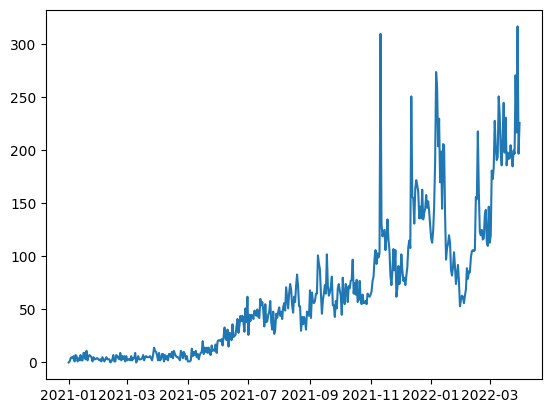

In [35]:
plt.plot(rentention['DATE'],rentention['weekly rentention'],label='Line Chart')